In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns

from pymc.gp.util import plot_gp_dist
from sklearn.preprocessing import StandardScaler


plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
seed: int = sum(map(ord, "bikes"))
rng: np.random.Generator = np.random.default_rng(seed=seed)


In [3]:
data_path = "https://raw.githubusercontent.com/christophM/interpretable-ml-book/master/data/bike.csv"

raw_data_df = pd.read_csv(
    data_path,
    dtype={
        "season": "category",
        "mnth": "category",
        "holiday": "category",
        "weekday": "category",
        "workingday": "category",
        "weathersit": "category",
        "cnt": "int",
    },
)

data_df = raw_data_df.copy()

data_df["date"] = pd.to_datetime("2011-01-01") + data_df["days_since_2011"].apply(
    lambda z: pd.Timedelta(z, unit="D")
)

data_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   season           731 non-null    category      
 1   yr               731 non-null    int64         
 2   mnth             731 non-null    category      
 3   holiday          731 non-null    category      
 4   weekday          731 non-null    category      
 5   workingday       731 non-null    category      
 6   weathersit       731 non-null    category      
 7   temp             731 non-null    float64       
 8   hum              731 non-null    float64       
 9   windspeed        731 non-null    float64       
 10  cnt              731 non-null    int64         
 11  days_since_2011  731 non-null    int64         
 12  date             731 non-null    datetime64[ns]
dtypes: category(6), datetime64[ns](1), float64(3), int64(3)
memory usage: 45.6 KB


In [4]:
target = "cnt"
target_scaled = f"{target}_scaled"

endog_scaler = StandardScaler()
exog_scaler = StandardScaler()


data_df[target_scaled] = endog_scaler.fit_transform(X=data_df[[target]])
data_df[["temp_scaled", "hum_scaled", "windspeed_scaled"]] = exog_scaler.fit_transform(
    X=data_df[["temp", "hum", "windspeed"]]
)


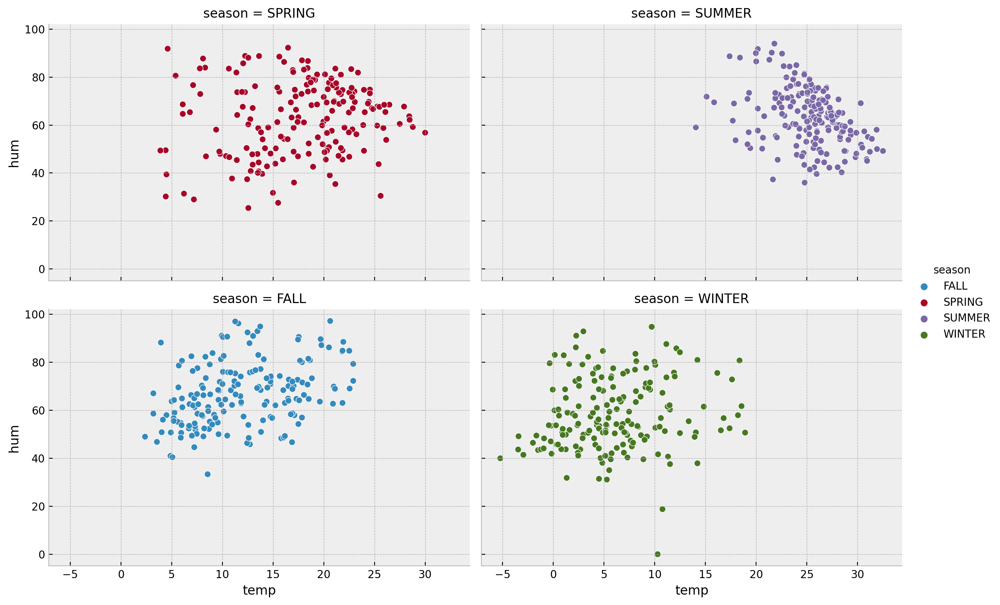

In [5]:
g = sns.relplot(
    data=data_df,
    x="temp",
    y="hum",
    hue="season",
    col="season",
    col_wrap=2,
    col_order=["SPRING", "SUMMER", "FALL", "WINTER"],
    height=4,
    aspect=1.5,
)

In [6]:
n = data_df.shape[0]
# target
cnt = data_df[target].to_numpy()
cnt_scaled = data_df[target_scaled].to_numpy()
# date feature
date = data_df["date"].to_numpy()
# model regressors
temp_scaled = data_df["temp_scaled"].to_numpy()
hum_scaled = data_df["hum_scaled"].to_numpy()
windspeed_scaled = data_df["windspeed_scaled"].to_numpy()
holiday_idx, holiday = data_df["holiday"].factorize(sort=True)
workingday_idx, workingday = data_df["workingday"].factorize(sort=True)
weathersit_idx, weathersit = data_df["weathersit"].factorize(sort=True)
t = data_df["days_since_2011"].to_numpy() / data_df["days_since_2011"].max()


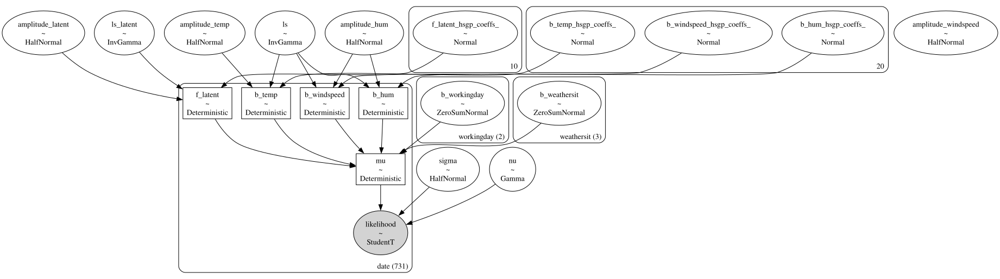

In [7]:
coords = {
    "date": date,
    "workingday": workingday,
    "weathersit": weathersit,
}


with pm.Model(coords=coords) as model:
    # --- priors ---
    ls_latent_params = pm.find_constrained_prior(
        distribution=pm.InverseGamma,
        lower=0.005,
        upper=0.5,
        init_guess={"alpha": 2, "beta": 0.1},
        mass=0.95,
    )
    ls_latent = pm.InverseGamma(name="ls_latent", **ls_latent_params)
    amplitude_latent = pm.HalfNormal(name="amplitude_latent", sigma=1)
    cov_latent = amplitude_latent**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls_latent)
    gp_latent = pm.gp.HSGP(m=[10], c=1.3, cov_func=cov_latent)
    f_latent = gp_latent.prior(name="f_latent", X=t[:, None], dims="date")

    ls_params = pm.find_constrained_prior(
        distribution=pm.InverseGamma,
        lower=0.5,
        upper=1.5,
        init_guess={"alpha": 2, "beta": 1},
        mass=0.95,
    )
    ls = pm.InverseGamma(name="ls", **ls_params)

    amplitude_temp = pm.HalfNormal(name="amplitude_temp", sigma=0.5)
    cov_temp = amplitude_temp**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_temp = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_temp)
    b_temp = gp_temp.prior(name="b_temp", X=temp_scaled[:, None], dims="date")

    amplitude_hum = pm.HalfNormal(name="amplitude_hum", sigma=0.5)
    cov_hum = amplitude_hum**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_hum = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_hum)
    b_hum = gp_hum.prior(name="b_hum", X=hum_scaled[:, None], dims="date")

    amplitude_windspeed = pm.HalfNormal(name="amplitude_windspeed", sigma=0.5)
    cov_windspeed = amplitude_windspeed**2 * pm.gp.cov.ExpQuad(input_dim=1, ls=ls)
    gp_windspeed = pm.gp.HSGP(m=[20], c=1.3, cov_func=cov_windspeed)
    b_windspeed = gp_hum.prior(
        name="b_windspeed", X=windspeed_scaled[:, None], dims="date"
    )

    b_workingday = pm.ZeroSumNormal(name="b_workingday", sigma=1, dims="workingday")
    b_weathersit = pm.ZeroSumNormal(name="b_weathersit", sigma=1, dims="weathersit")
    nu = pm.Gamma(name="nu", alpha=8, beta=2)
    sigma = pm.HalfNormal(name="sigma", sigma=1)

    # --- model parametrization ---
    mu = pm.Deterministic(
        name="mu",
        var=(
            f_latent
            + b_temp * temp_scaled
            + b_hum * hum_scaled
            + b_windspeed * windspeed_scaled
            + b_workingday[workingday_idx]
            + b_weathersit[weathersit_idx]
        ),
        dims="date",
    )

    # --- likelihood ---
    likelihood = pm.StudentT(
        name="likelihood", mu=mu, nu=nu, sigma=sigma, dims="date", observed=cnt_scaled
    )


pm.model_to_graphviz(model=model)


In [8]:
with model:
    # --- prior samples ---
    prior_predictive = pm.sample_prior_predictive(samples=500, random_seed=rng)

Sampling: [amplitude_hum, amplitude_latent, amplitude_temp, amplitude_windspeed, b_hum_hsgp_coeffs_, b_temp_hsgp_coeffs_, b_weathersit, b_windspeed_hsgp_coeffs_, b_workingday, f_latent_hsgp_coeffs_, likelihood, ls, ls_latent, nu, sigma]


[Text(0.5, 1.0, 'Prior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'cnt_scaled')]

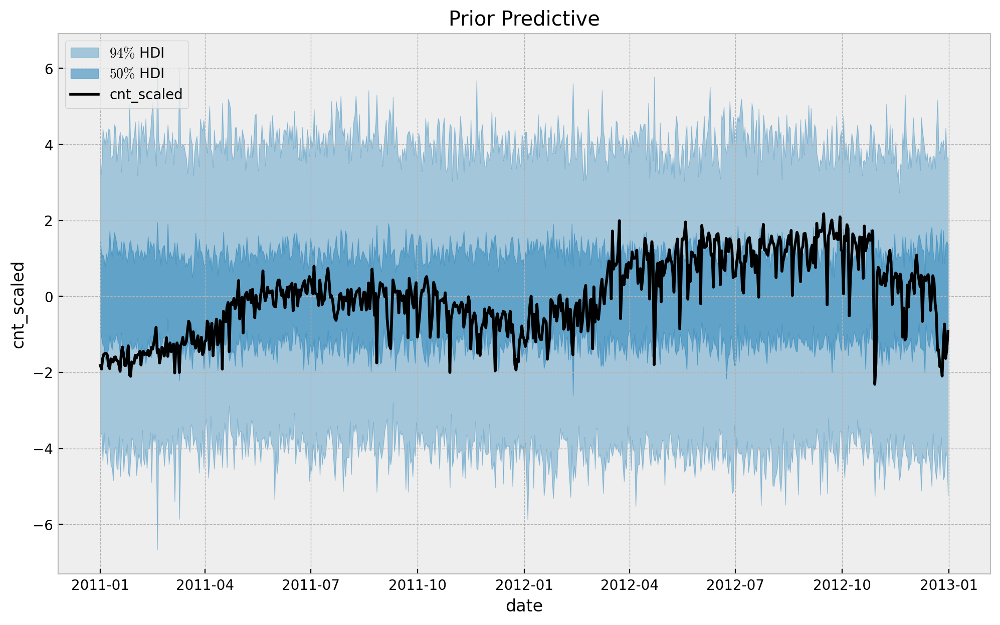

In [9]:
fig, ax = plt.subplots()
az.plot_hdi(
    x=date,
    y=prior_predictive["prior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.94,
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=date,
    y=prior_predictive["prior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.5,
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
ax.plot(date, cnt_scaled, color="black", label=target_scaled)
ax.legend(loc="upper left")
ax.set(
    title="Prior Predictive",
    xlabel="date",
    ylabel=target_scaled,
)

In [10]:
with model:
    idata = pm.sample(
        target_accept=0.95,
        draws=2_000,
        chains=5,
        nuts_sampler="numpyro",
        random_seed=rng,
    )
    posterior_predictive = pm.sample_posterior_predictive(trace=idata, random_seed=rng)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/pymc/sampling/mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...
Compilation time =  0:00:20.582173
Sampling...


  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

Sampling time =  0:00:55.612719
Transforming variables...


Sampling: [likelihood]


Transformation time =  0:00:03.537813


In [11]:
idata["sample_stats"]["diverging"].sum().item()


0

In [13]:
var_names = [
    "ls_latent",
    "ls",
    "amplitude_latent",
    "amplitude_temp",
    "amplitude_hum",
    "amplitude_windspeed",
    "b_workingday",
    "b_weathersit",
    "sigma",
    "nu",
]

az.summary(data=idata, var_names=var_names)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ls_latent,0.084,0.025,0.038,0.128,0.000,0.000,3213.0,5362.0,1.0
ls,1.247,0.216,0.875,1.648,0.004,0.003,2560.0,5801.0,1.0
amplitude_latent,0.725,0.197,0.417,1.091,0.004,0.003,2435.0,4246.0,1.0
amplitude_temp,0.571,0.198,0.258,0.938,0.004,0.002,2772.0,3926.0,1.0
amplitude_hum,0.107,0.030,0.059,0.164,0.001,0.000,3231.0,5311.0,1.0
amplitude_windspeed,0.395,0.303,0.000,0.940,0.003,0.002,7793.0,4044.0,1.0
b_workingday[NO WORKING DAY],-0.036,0.012,-0.058,-0.012,0.000,0.000,13886.0,7377.0,1.0
b_workingday[WORKING DAY],0.036,0.012,0.012,0.058,0.000,0.000,13886.0,7377.0,1.0
b_weathersit[GOOD],0.382,0.041,0.307,0.461,0.001,0.000,4547.0,6143.0,1.0
b_weathersit[MISTY],0.204,0.037,0.134,0.274,0.001,0.000,4819.0,6369.0,1.0


/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Text(0.5, 0.98, 'Time-Varying Coefficient Model - Trace')

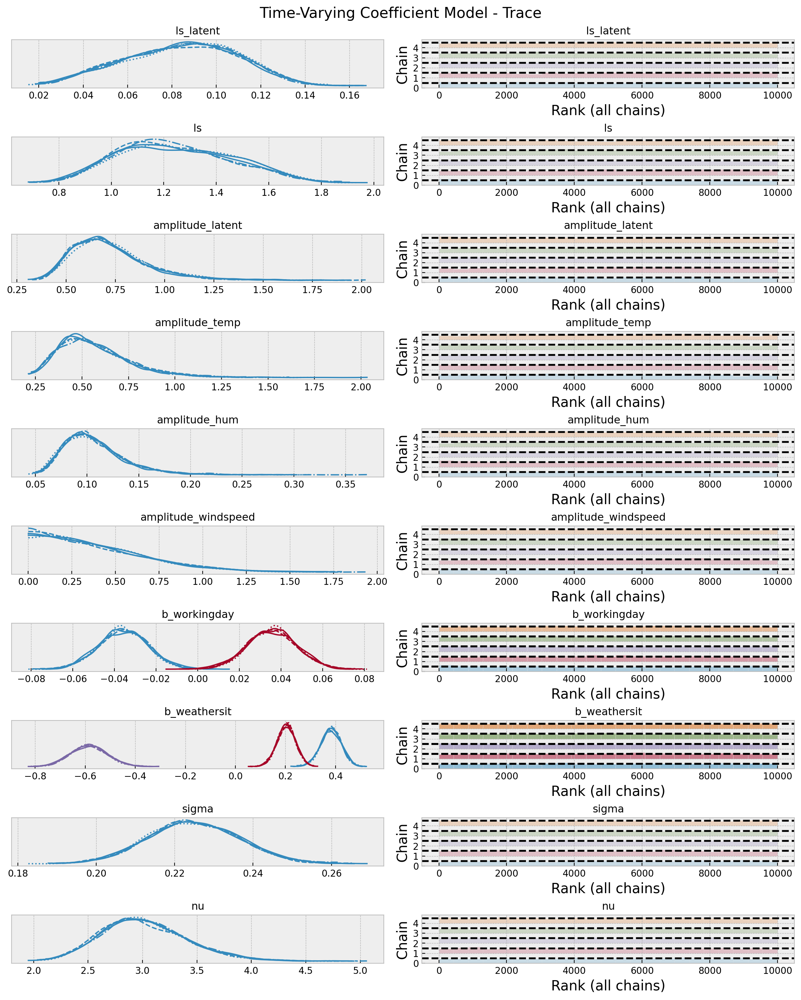

In [14]:
axes = az.plot_trace(
    data=idata,
    var_names=var_names,
    compact=True,
    kind="rank_bars",
    backend_kwargs={"figsize": (12, 15), "layout": "constrained"},
)
plt.gcf().suptitle("Time-Varying Coefficient Model - Trace", fontsize=16)

array([<AxesSubplot:title={'center':'94.0% HDI'}>,
       <AxesSubplot:title={'center':'ess'}>,
       <AxesSubplot:title={'center':'r_hat'}>], dtype=object)

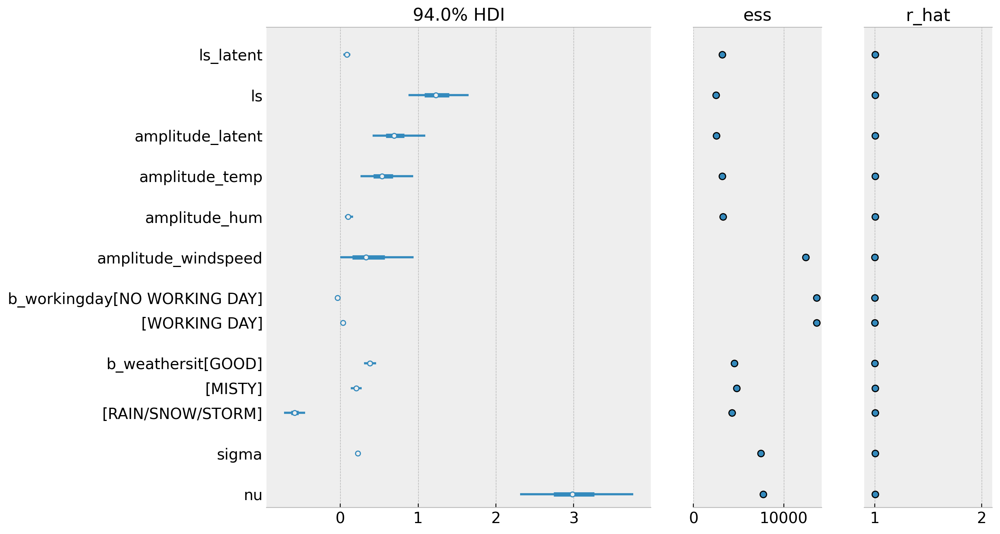

In [15]:
az.plot_forest(
    data=idata,
    var_names=var_names,
    combined=True,
    figsize=(12, 8),
    ess=True,
    r_hat=True,
)

[Text(0.5, 1.0, 'Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'cnt_scaled')]

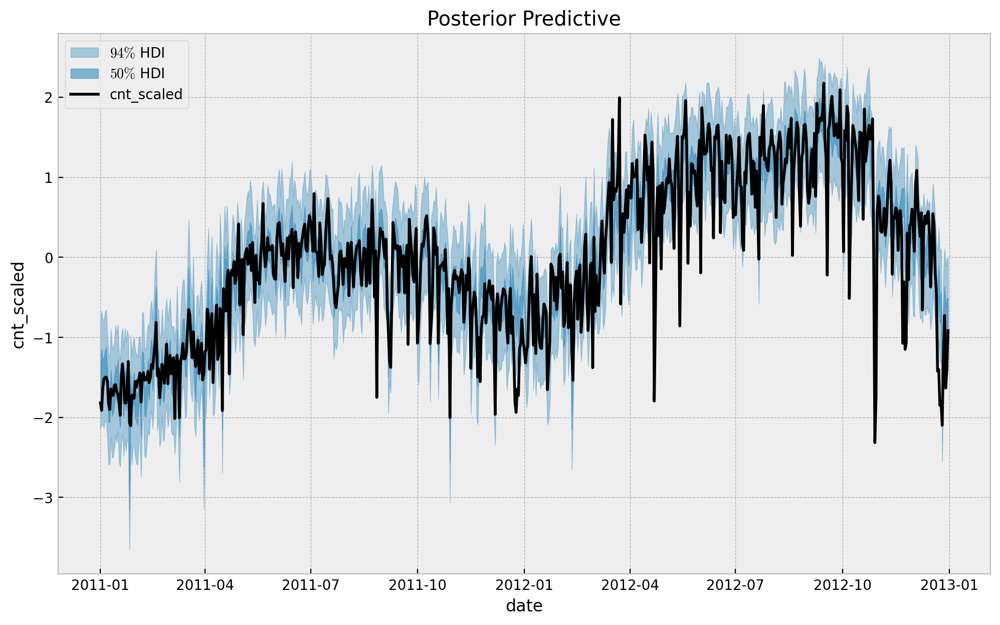

In [16]:
fig, ax = plt.subplots()
az.plot_hdi(
    x=date,
    y=posterior_predictive["posterior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.94,
    fill_kwargs={"alpha": 0.4, "label": "$94\%$ HDI"},
    ax=ax,
)
az.plot_hdi(
    x=date,
    y=posterior_predictive["posterior_predictive"]["likelihood"],
    color="C0",
    smooth=False,
    hdi_prob=0.5,
    fill_kwargs={"alpha": 0.6, "label": "$50\%$ HDI"},
    ax=ax,
)
ax.plot(date, cnt_scaled, color="black", label=target_scaled)
ax.legend(loc="upper left")
ax.set(
    title="Posterior Predictive",
    xlabel="date",
    ylabel=target_scaled,
)

[Text(0.5, 1.0, 'Latent Process - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

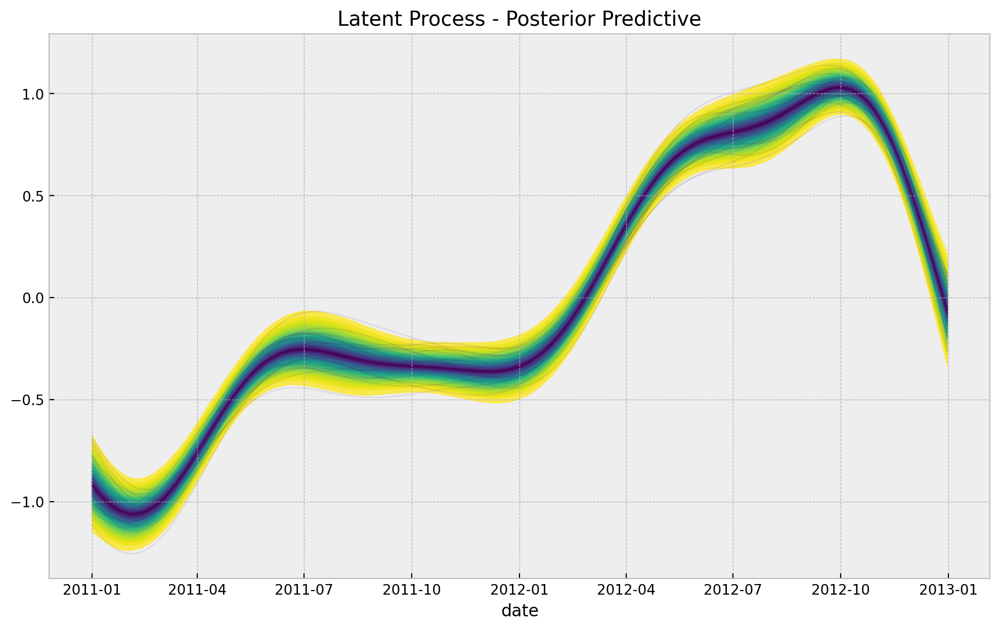

In [17]:
f_latent_samples = az.extract(data=idata, var_names=["f_latent"]).transpose(
    "sample", ...
)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=f_latent_samples,
    x=date,
    palette="viridis_r",
)
ax.set(title="Latent Process - Posterior Predictive", xlabel="date", ylabel=None)


[Text(0.5, 1.0, 'Temperature Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

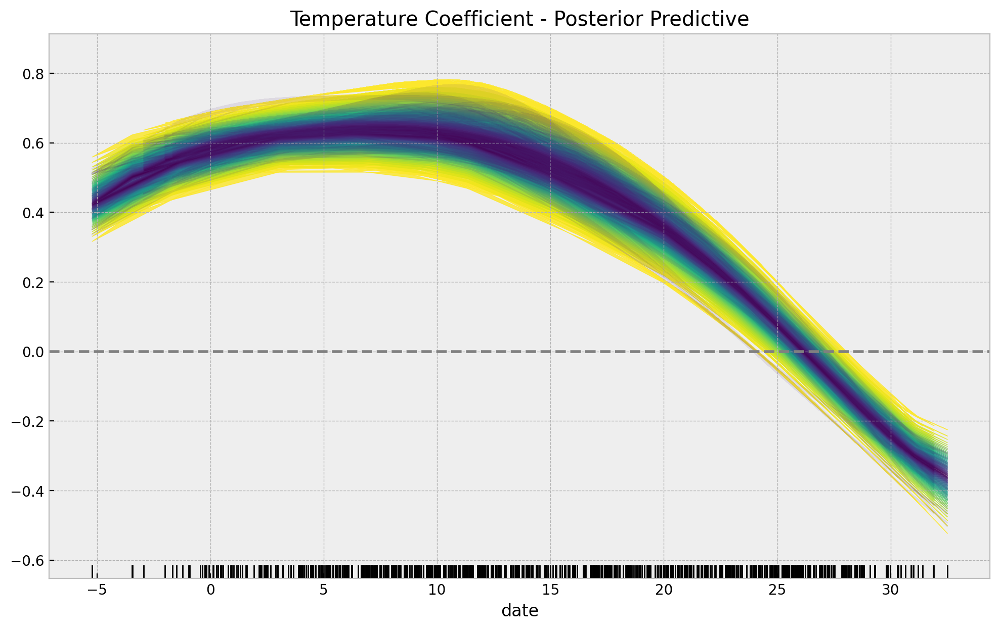

In [33]:
b_temp_samples = az.extract(data=idata, var_names=["b_temp"]).transpose("sample", ...)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_temp_samples,
    x=data_df["temp"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["temp"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(
    title="Temperature Coefficient - Posterior Predictive", xlabel="date", ylabel=None
)


[Text(0.5, 1.0, 'Temperature Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

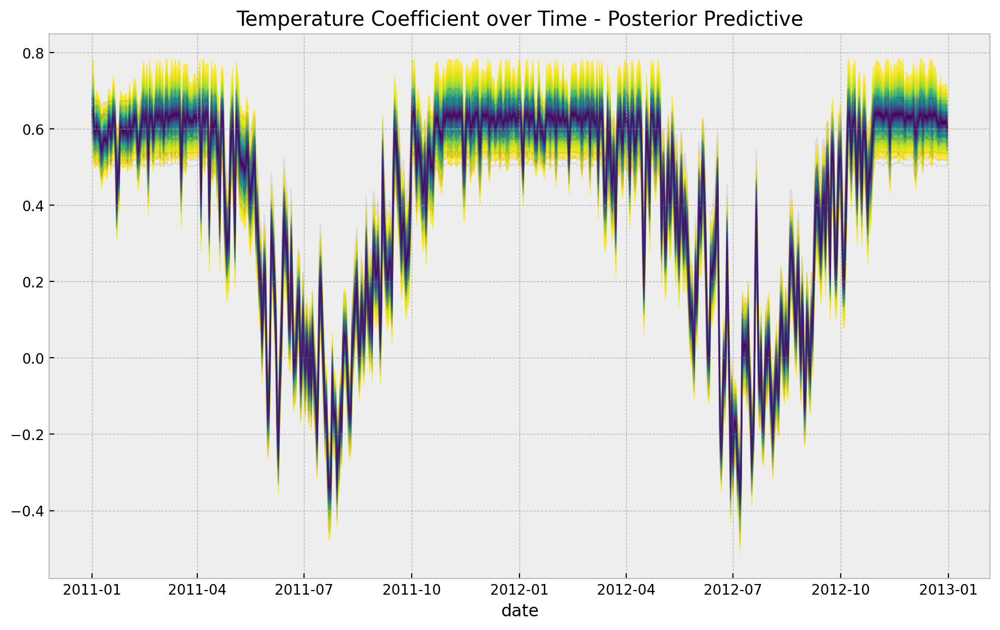

In [ ]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_temp_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Temperature Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)

[Text(0.5, 1.0, 'Humidity Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

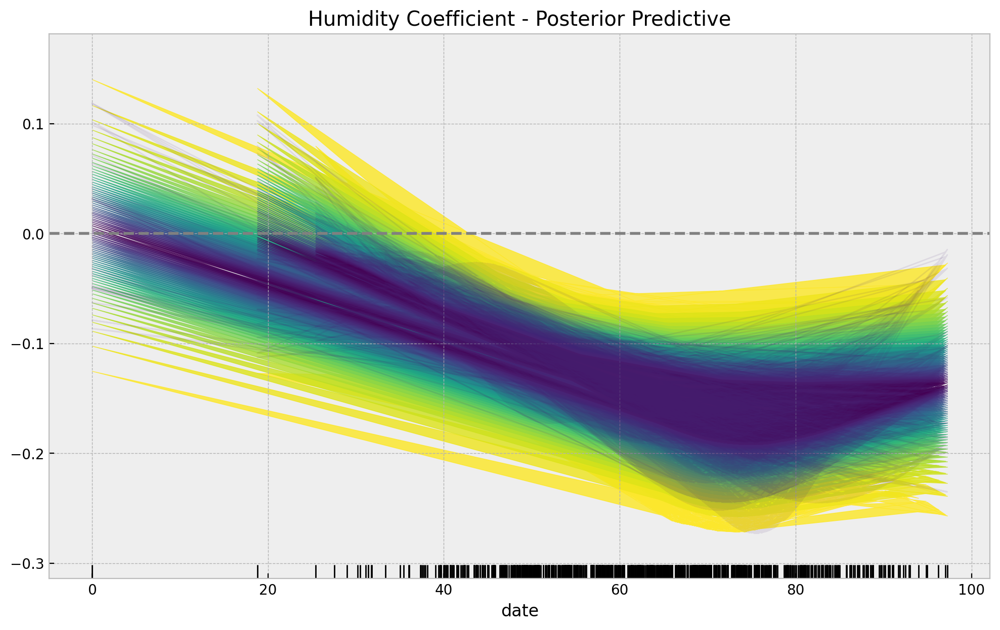

In [ ]:
b_hum_samples = az.extract(data=idata, var_names=["b_hum"]).transpose("sample", ...)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_hum_samples,
    x=data_df["hum"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["hum"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(title="Humidity Coefficient - Posterior Predictive", xlabel="date", ylabel=None)

In [ ]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_hum_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Humidity Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)


[Text(0.5, 1.0, 'Humidity Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

[Text(0.5, 1.0, 'Wind Speed Coefficient - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

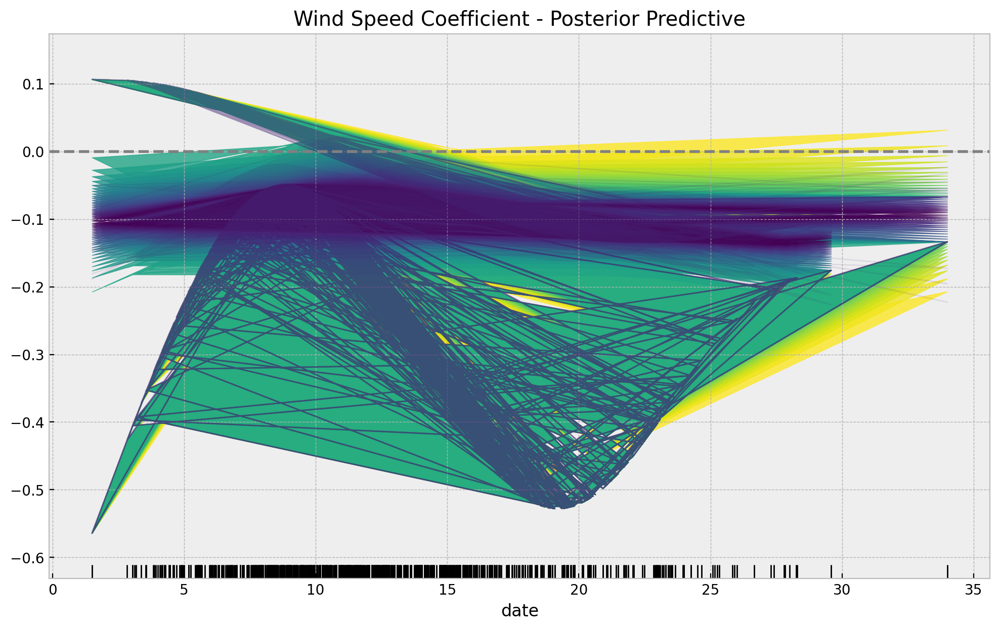

In [ ]:
b_windspeed_samples = az.extract(data=idata, var_names=["b_windspeed"]).transpose(
    "sample", ...
)

fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_windspeed_samples,
    x=data_df["windspeed"].to_numpy(),
    palette="viridis_r",
)
sns.rugplot(x=data_df["windspeed"], color="black", ax=ax)
ax.axhline(y=0.0, color="gray", linestyle="--")
ax.set(
    title="Wind Speed Coefficient - Posterior Predictive", xlabel="date", ylabel=None
)


[Text(0.5, 1.0, 'Wind Speed Coefficient over Time - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

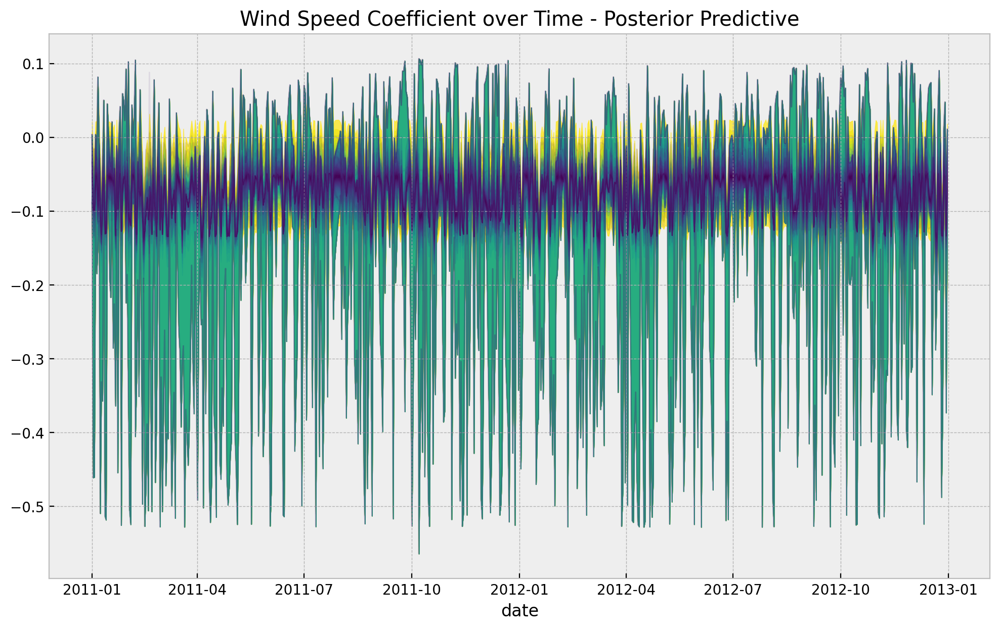

In [ ]:
fig, ax = plt.subplots()
plot_gp_dist(
    ax=ax,
    samples=b_windspeed_samples,
    x=date,
    palette="viridis_r",
)
ax.set(
    title="Wind Speed Coefficient over Time - Posterior Predictive",
    xlabel="date",
    ylabel=None,
)


array([[3021.28861012, 3004.83178679, 2988.65720117, ..., 4307.66826784,
        4264.68033823, 4221.92011352],
       [2553.10201021, 2539.60242358, 2526.46898592, ..., 4562.33611888,
        4528.33986947, 4494.51229067],
       [3027.48690406, 3011.25865713, 2995.29723381, ..., 4107.13848227,
        4064.08760293, 4021.3197843 ],
       ...,
       [2695.94995831, 2678.02961024, 2660.42473294, ..., 4456.53808555,
        4421.59506731, 4386.82785718],
       [2971.14804055, 2957.40064224, 2943.93016071, ..., 4439.9544195 ,
        4398.56441768, 4357.36340069],
       [3211.68321856, 3191.27838211, 3171.08669083, ..., 4878.8768504 ,
        4848.29897631, 4817.83004236]])

[Text(0.5, 1.0, 'Latent Process - Posterior Predictive'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '')]

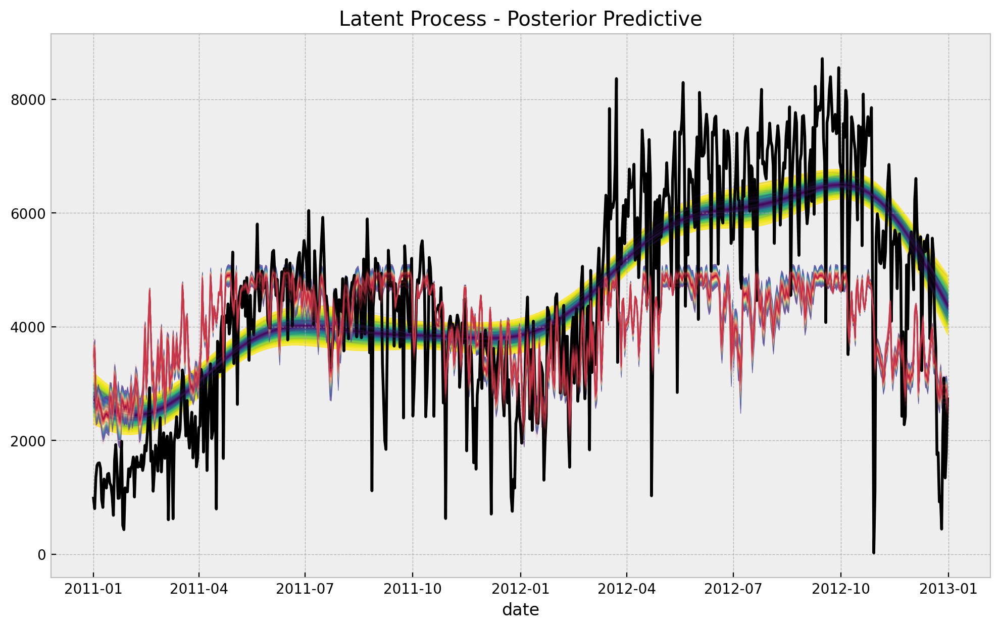

In [42]:
fig, ax = plt.subplots()
sns.lineplot(x=date, y=cnt, color="black", ax=ax)
plot_gp_dist(
    ax=ax,
    samples=endog_scaler.inverse_transform(X=f_latent_samples),
    x=date,
    palette="viridis_r",
)
plot_gp_dist(
    ax=ax,
    samples=endog_scaler.inverse_transform(X=b_temp_samples * temp_scaled[None, ...]),
    x=date,
    palette="Spectral_r",
)
ax.set(title="Latent Process - Posterior Predictive", xlabel="date", ylabel=None)


In [62]:
vectorized_endog_scaler = np.vectorize(
    pyfunc=endog_scaler.inverse_transform,
    excluded=[1],
    signature="(m) -> (m)",
)

vectorized_endog_scaler(np.expand_dims(a=b_temp_samples.to_numpy(), axis=1))

ValueError: Expected 2D array, got 1D array instead:
array=[ 7.04794876e-01  6.95448552e-01  6.47384723e-01  6.52400839e-01
  6.83353333e-01  6.58138331e-01  6.47606806e-01  5.96141901e-01
  5.42342670e-01  5.68623023e-01  6.03606174e-01  6.10050736e-01
  5.96141901e-01  5.88382505e-01  6.89066446e-01  6.87632446e-01
  6.15411973e-01  6.72839426e-01  7.14817169e-01  7.07267396e-01
  6.18233938e-01  3.46209912e-01  4.43553532e-01  4.45742415e-01
  6.79978059e-01  6.73750290e-01  6.45452013e-01  6.57013124e-01
  6.47606806e-01  6.72679795e-01  6.23758695e-01  6.41359707e-01
  7.06510110e-01  6.33495478e-01  6.66722613e-01  6.89066446e-01
  7.14183807e-01  7.11031504e-01  6.77289404e-01  5.34565581e-01
  5.55209823e-01  6.36760598e-01  6.78996266e-01  7.13230339e-01
  6.58891645e-01  7.09094058e-01  7.12892811e-01  6.39398918e-01
  5.22834154e-01  6.71851897e-01  7.14097414e-01  7.14846569e-01
  6.26014448e-01  6.78222294e-01  7.14971226e-01  6.94967941e-01
  7.13662648e-01  7.05079433e-01  6.65409931e-01  7.09314432e-01
  7.08285283e-01  6.50125682e-01  7.07267396e-01  6.82721112e-01
  6.87735031e-01  7.07299255e-01  7.14837334e-01  7.14975583e-01
  6.79303179e-01  7.13230339e-01  7.10160599e-01  6.82598078e-01
  7.11269845e-01  7.13065157e-01  6.94482966e-01  6.58891645e-01
  4.88829882e-01  5.97478076e-01  7.09122994e-01  6.44727736e-01
  6.33410671e-01  7.03606811e-01  7.14065914e-01  7.08332695e-01
  7.08996148e-01  7.02937213e-01  7.08406566e-01  7.14890226e-01
  7.14977718e-01  7.09922787e-01  7.14977718e-01  7.13502717e-01
  6.86579718e-01  4.18002009e-01  6.59612318e-01  6.78058842e-01
  6.37712438e-01  7.07995046e-01  7.05477266e-01  6.48329951e-01
  3.64245473e-01  5.54701759e-01  6.61041406e-01  6.03824828e-01
  6.28083315e-01  6.44341655e-01  6.16866075e-01  5.38536543e-01
  5.49424071e-01  3.65884613e-01  6.13940546e-01  7.07698959e-01
  6.12954712e-01  3.98504992e-01  3.35954848e-01  2.67812721e-01
  3.00260099e-01  3.07069179e-01  5.42671193e-01  5.97478076e-01
  6.22570273e-01  4.70508247e-01  3.09326302e-01  6.59612318e-01
  6.13940546e-01  5.88680327e-01  5.25753380e-01  5.10874492e-01
  5.03164233e-01  5.03164233e-01  4.83920751e-01  4.98451526e-01
  5.38536543e-01  5.24298207e-01  4.42288424e-01  4.08340864e-01
  4.44105794e-01  4.68799646e-01  5.06270409e-01  4.95272773e-01
  3.46788675e-01  3.42473555e-01  2.67812721e-01  1.84929683e-01
  1.82417091e-01  3.45490708e-02  1.18476029e-01  1.97440166e-01
  1.62175051e-01 -4.44671886e-02 -1.70586323e-01 -1.38991542e-01
  1.34210157e-02  3.00260099e-01  2.58349079e-01  2.19696855e-01
  1.28834121e-01  3.71880988e-02 -1.72968173e-01 -2.58971202e-01
 -1.11479635e-01 -1.82256892e-02  8.45685230e-02  2.58349079e-01
  3.42473555e-01  2.81850641e-01  2.77194785e-01  2.17239240e-01
  7.14435786e-02  6.35527358e-02  2.58349079e-01  1.21070937e-01
 -4.44671886e-02 -2.87412279e-02 -1.55943082e-02  7.66986444e-02
  1.23660220e-01  1.15881777e-01 -7.82559724e-02 -2.87412279e-02
  7.14435786e-02 -1.03250331e-02 -6.01174319e-02  8.13923586e-03
 -2.34878353e-02 -8.59808898e-02 -2.41556238e-03 -9.62287250e-02
  3.19065243e-02 -4.44671886e-02 -8.85477435e-02 -1.34036556e-01
 -2.23317382e-01 -8.59808898e-02  1.21070937e-01  1.74853766e-01
  1.02869514e-01  2.21447537e-04 -8.59808898e-02 -1.75345498e-01
 -1.51271135e-01 -2.74578618e-01 -3.38798481e-01 -3.40070068e-01
 -3.06534842e-01 -7.56721673e-02 -1.60984619e-01 -1.70586323e-01
 -1.82426347e-01 -3.22192599e-01 -2.48821544e-01 -2.52915714e-01
 -1.60984619e-01 -1.94067516e-01 -3.92347536e-02  2.92668702e-02
  2.66270146e-02  8.13923586e-03 -7.30882399e-02 -1.41458906e-01
 -1.70586323e-01 -1.46378752e-01  5.50051007e-03  3.45490708e-02
  1.05478281e-01  1.33994179e-01  1.67257670e-01  5.82885210e-02
 -1.29586214e-02  2.39838630e-02  1.08081761e-01  6.88155919e-02
  2.66270146e-02  8.71875363e-02  2.41591186e-01  1.44286458e-01
  1.10683024e-01  6.09211586e-02  1.23660220e-01  3.85850646e-02
  2.53584928e-01  2.46402359e-01  1.94944232e-01  1.99929035e-01
  2.34335261e-01  1.57078871e-01  3.19065243e-02  1.44286458e-01
  4.88829882e-01  3.55339688e-01  2.61444608e-01  2.14780140e-01
  1.84929683e-01  2.04897355e-01  2.31377145e-01  2.12316655e-01
  1.44286458e-01  4.08340864e-01  6.01732335e-01  5.71111572e-01
  5.46743312e-01  4.70508247e-01  4.44105794e-01  3.65884613e-01
  2.77194785e-01  3.29380005e-01  3.35954848e-01  2.60722059e-01
  2.17239240e-01  2.53584928e-01  2.58349079e-01  3.09326302e-01
  4.38629899e-01  6.63151997e-01  6.99038281e-01  6.82721112e-01
  5.81823979e-01  4.92066851e-01  5.67424150e-01  5.41300495e-01
  5.22834154e-01  4.87201447e-01  4.23713616e-01  4.33089338e-01
  4.82270457e-01  3.80368201e-01  4.67083765e-01  5.48086330e-01
  5.39921181e-01  5.00029056e-01  5.03164233e-01  4.85422036e-01
  5.93128405e-01  6.47541800e-01  6.52203650e-01  6.52964360e-01
  6.08954239e-01  5.98550200e-01  5.81823979e-01  6.00677942e-01
  7.09653400e-01  7.03560031e-01  7.12705970e-01  7.06461445e-01
  6.70560639e-01  6.87113637e-01  6.64537729e-01  6.68591277e-01
  7.10878076e-01  7.02999980e-01  6.75007884e-01  6.64537729e-01
  6.71208376e-01  6.85498419e-01  7.11542216e-01  6.99038281e-01
  6.34281578e-01  5.07811713e-01  5.07811713e-01  6.16866075e-01
  7.05810453e-01  7.11769057e-01  7.10160599e-01  6.08954239e-01
  6.27177879e-01  6.57436243e-01  6.34281578e-01  6.89720018e-01
  6.88690287e-01  6.88169249e-01  6.13940546e-01  5.53164446e-01
  6.14922014e-01  7.11326919e-01  7.13902710e-01  7.13642584e-01
  7.14992209e-01  7.09653400e-01  6.81581134e-01  6.09962502e-01
  6.63151997e-01  7.08996148e-01  7.14721622e-01  7.11997176e-01
  6.77289404e-01  6.93122256e-01  7.13662648e-01  7.13043946e-01
  6.52203650e-01  6.88690287e-01  7.05714915e-01  6.93122256e-01
  7.12427479e-01  6.81581134e-01  6.46749011e-01  6.51438412e-01
  6.89720018e-01  7.14890226e-01  7.11938594e-01  7.12135110e-01
  7.11326919e-01  7.14992681e-01  7.00133359e-01  7.14022721e-01
  6.63151997e-01  6.91726641e-01  7.11447313e-01  5.66927691e-01
  4.70835708e-01  7.08996148e-01  7.08569990e-01  6.76241007e-01
  7.07397769e-01  6.80661040e-01  7.14395817e-01  7.11769057e-01
  6.83844882e-01  7.11769057e-01  6.22392686e-01  5.99210400e-01
  6.38131154e-01  6.89897384e-01  7.14846569e-01  6.38131154e-01
  6.73750290e-01  6.11107233e-01  5.91471456e-01  6.74650613e-01
  7.05477266e-01  7.14921870e-01  7.05810453e-01  6.49893354e-01
  7.13356324e-01  7.13662648e-01  7.10213670e-01  6.78656155e-01
  6.01732335e-01  6.71851897e-01  7.13776037e-01  7.08332695e-01
  7.08996148e-01  7.13681788e-01  7.00277454e-01  7.04882037e-01
  7.08669041e-01  7.13352073e-01  6.80661040e-01  5.18209248e-01
  6.78996266e-01  7.12705970e-01  7.02999980e-01  7.13203263e-01
  7.05138868e-01  7.03732954e-01  7.13184248e-01  7.13184248e-01
  7.14432850e-01  6.74385397e-01  6.19742416e-01  6.65223732e-01
  7.14721622e-01  7.13007945e-01  6.93662864e-01  6.97756618e-01
  7.04719539e-01  5.79489201e-01  7.00681273e-01  6.59612318e-01
  7.11105617e-01  6.96809539e-01  7.05714915e-01  6.67925809e-01
  5.12394143e-01  6.62453080e-01  7.14395281e-01  6.96394373e-01
  6.04861726e-01  4.36790955e-01  4.19912193e-01  4.53088677e-01
  6.39398918e-01  5.35744602e-01  5.97478076e-01  4.78946006e-01
  4.45918127e-01  5.04720012e-01  4.60143315e-01  3.48935401e-01
  5.54701759e-01  6.37712438e-01  6.28984676e-01  7.11751715e-01
  5.81823979e-01  5.67424150e-01  6.91726641e-01  6.50667703e-01
  6.49114424e-01  6.41317319e-01  6.04861726e-01  4.85563761e-01
  6.40234370e-01  6.68591277e-01  6.37712438e-01  5.58589049e-01
  5.74740276e-01  6.28083315e-01  7.02837618e-01  6.73127065e-01
  6.32535798e-01  5.66182356e-01  3.35954848e-01  1.72323285e-01
  3.31579566e-01  6.08954239e-01  5.61147382e-01  5.13906596e-01
  4.25602548e-01  6.73757956e-01  7.12151897e-01  6.60329474e-01
  5.92024891e-01  5.61147382e-01  6.15896788e-01  6.87643275e-01
  6.14922014e-01  6.07939084e-01  3.18301024e-01  4.38629899e-01
  4.47721069e-01  2.79525438e-01  2.95690946e-01  4.42288424e-01
  4.93673447e-01  3.98504992e-01  4.14158175e-01  5.49424071e-01
  5.01601213e-01  4.38629899e-01  3.20528417e-01  4.18002009e-01
  3.22749777e-01  2.53584928e-01  3.70057119e-01  4.38629899e-01
  3.53212216e-01  2.97979758e-01  3.57463238e-01  3.13825564e-01
  2.95690946e-01  1.99929035e-01  1.23660220e-01  8.45685230e-02
  9.24234732e-02  2.13438296e-02 -1.03250331e-02  1.94944232e-01
  1.23660220e-01  2.02413788e-01  3.94524085e-01  3.46788675e-01
  3.59577747e-01  4.87201447e-01  4.60143315e-01  3.46788675e-01
  2.17239240e-01  2.66270146e-02 -2.34878353e-02 -5.05183972e-03
  2.04897355e-01  1.97440166e-01  2.19696855e-01  2.46402359e-01
  2.67812721e-01  3.72132187e-01  4.29361332e-01  9.76520089e-02
 -1.91756221e-01 -2.52915714e-01 -1.77712483e-01 -3.92347536e-02
 -7.56721673e-02  1.07815428e-02  2.70167655e-01  6.88155919e-02
 -9.36732982e-02 -3.14563235e-01 -1.41458906e-01 -2.76471095e-01
 -1.89436621e-01 -1.87106034e-01 -2.10012123e-01 -3.01533729e-01
 -3.03215188e-01 -3.56916403e-01 -2.91131695e-01  2.66270146e-02
 -5.05183972e-03  8.13923586e-03  1.07815428e-02 -3.92347536e-02
  5.03817716e-02 -8.34073394e-02 -1.36515410e-01 -2.82071040e-01
 -2.21122365e-01 -1.56141038e-01  1.67257670e-01  3.63789722e-01
  1.62175051e-01 -7.05011903e-02 -9.87801439e-02 -1.55943082e-02
 -1.75345498e-01 -1.89436621e-01 -1.14004856e-01 -7.69046647e-03
 -3.66124641e-02  1.87038209e-02  5.50051007e-03 -1.03873604e-01
 -1.43920365e-01 -2.21122365e-01 -1.53710782e-01 -1.03873604e-01
 -5.23029950e-02 -9.62287250e-02 -1.14004856e-01  1.07815428e-02
  8.45685230e-02  5.82885210e-02 -5.05183972e-03 -2.34878353e-02
  3.98267037e-02  2.21447537e-04 -1.29586214e-02  1.28834121e-01
  2.55970977e-01  2.55970977e-01  2.17239240e-01  1.62175051e-01
  7.40733871e-02  5.30171768e-02  1.79897691e-01  2.04897355e-01
  5.03817716e-02 -2.87412279e-02  1.08081761e-01  3.98267037e-02
 -1.38991542e-01 -1.06412386e-01  7.14435786e-02  3.71880988e-02
 -2.08558414e-02 -5.49123889e-02  7.14435786e-02  5.03817716e-02
  1.87438441e-01  3.27176928e-01  3.94524085e-01  4.08340864e-01
  3.55339688e-01  3.20528417e-01  2.63092719e-01  3.31579566e-01
  4.02460656e-01  4.00487474e-01  2.91101770e-01  4.63628097e-01
  4.75592375e-01  3.55339688e-01  2.14780140e-01  5.09345795e-01
  5.35744602e-01  4.68799646e-01  2.58349079e-01  2.14780140e-01
  3.02534686e-01  4.83920751e-01  5.13906596e-01  5.24298207e-01
  3.76264822e-01  1.92447265e-01  1.92447265e-01  3.13825564e-01
  4.60143315e-01  6.58166584e-01  6.83285450e-01  6.28083315e-01
  5.35744602e-01  6.40234370e-01  6.37712438e-01  6.76241007e-01
  5.22834154e-01  4.44105794e-01  6.02782127e-01  6.17831055e-01
  5.21364721e-01  4.40463857e-01  5.81823979e-01  6.07939084e-01
  5.77127565e-01  4.80610882e-01  3.84447086e-01  4.68799646e-01
  4.77273844e-01  5.07811713e-01  5.90916607e-01  6.35146455e-01
  7.12908748e-01  6.98615919e-01  6.94136222e-01  6.99869323e-01
  7.05138868e-01  7.11105617e-01  7.12705970e-01  7.13352073e-01
  7.14975583e-01  7.01234427e-01  6.96433105e-01  6.79249274e-01
  6.53721466e-01  5.80659758e-01  7.05138868e-01  7.14574455e-01
  7.12151897e-01  7.04446149e-01  7.11326919e-01  7.05477266e-01
  6.84951706e-01  6.89207010e-01  7.00681273e-01  7.06461445e-01
  6.92703906e-01  7.12822894e-01  6.98516532e-01  7.13776037e-01
  7.14783433e-01  7.14991037e-01  7.13359332e-01  7.14999297e-01
  7.14999297e-01  7.03368977e-01  6.21633374e-01  5.93128405e-01
  6.36862376e-01  7.04450681e-01  7.12342974e-01  6.84400084e-01
  6.82721112e-01  6.39398918e-01  7.00681273e-01  7.14998918e-01
  7.14975583e-01  7.13511653e-01  7.11542216e-01  6.95982919e-01
  6.76241007e-01  6.62453080e-01  7.09122994e-01  7.09909880e-01
  7.10878076e-01  7.08996148e-01  6.98516532e-01  6.87314492e-01
  7.14757497e-01  6.96809539e-01  7.03560031e-01  7.03099601e-01
  7.03099601e-01  7.04450681e-01  6.71916906e-01].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [56]:
.shape


(10000, 731, 1)